<a href="https://colab.research.google.com/github/YuriiKlim/Projects/blob/Clothing_Classifier/clothing_classifier_90k.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import sys
import shutil
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO
from urllib.request import urlopen
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
from sklearn.metrics import accuracy_score, ConfusionMatrixDisplay
import requests
from concurrent.futures import ThreadPoolExecutor
import random

import SegCloth
from SegCloth import segment_clothing

from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
os.environ['TORCH_USE_CUDA_DSA'] = '1'


device = "cuda" if torch.cuda.is_available() else "cpu"
torch.set_default_device(device)
generator = torch.Generator(device='cuda')

torch.manual_seed(0)

Hardware accelerator e.g. GPU is available in the environment, but no `device` argument is passed to the `Pipeline` object. Model will be on CPU.


In [ ]:
df = pd.read_csv('C:/Users/klimk/Desktop/Project/products_final0.1.csv')
#df = pd.read_csv('C:/Users/klimk/Desktop/Nike/NikeOnly.csv')

In [ ]:
df

,sku,Type,Color,Season,Gender,Brand
0,М990GL6,Sneakers,Grey,Demi-season,Male,New Balance
1,М2002RJX,Sneakers,Grey,Demi-season,Male,New Balance
2,ЕЕ5364,Sneakers,Black,Demi-season,Female,Adidas
3,ZXNCSMM1013-BLACK,Sweater,Black,Demi-season,Male,Castore
4,ZWFB8P557-ORS,Longsleeve,Black,Demi-season,Female,Nike
...,...,...,...,...,...,...
273439,561,Boots,Brown,Winter,Male,Blundstone
273440,207,T-shirt,Beige,Summer,Male,Merz b. Schwanen
273441,199,T-shirt,Blue,Summer,Male,Lois Jeans
273442,120,Pants,Blue,Demi-season,Male,Universal Works


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 275164 entries, 0 to 275163
Data columns (total 1 columns):
 #   Column                              Non-Null Count   Dtype 
---  ------                              --------------   ----- 
 0   sku,Type,Color,Season,Gender,Brand  275164 non-null  object
dtypes: object(1)
memory usage: 2.1+ MB


In [ ]:
type_counts = df['Type'].value_counts()
type_counts

Type
Sneakers             78622
T-shirt              41641
Pants                21778
Shorts               17907
Hoodie               15440
Jacket               12886
Gumshoes              9938
Sweater               9306
Sweatshirt            8471
Longsleeve            6783
Slippers              5883
Boots                 5505
Tank-top              5160
Leggings              4177
Top                   3914
Football boots        3832
Polo                  3807
Full-zip Hoodie       3555
Shirt                 3425
Football sneakers     2003
Puffer jacket         1863
Sandals               1740
Shoes                 1492
Vest                  1445
Dress                 1292
Skirt                  835
Parka                  744
Name: count, dtype: int64

In [ ]:
type_counts = df['Color'].value_counts()
type_counts

Color
Black                  71932
White                  37981
Blue                   28215
Grey                   23429
Beige                  17411
                       ...  
Purple/Bordo               1
Bordo/Olive                1
Metallic/Light-Blue        1
Peach/Pink                 1
Red/Turquoise              1
Name: count, Length: 371, dtype: int64

In [ ]:
img_size = 224
batch_size = 512

In [ ]:
transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
])

In [ ]:
import cv2
from ultralytics import YOLO


class PhotoProcessing:
    def __init__(self, yolo_model_path='yolov8n.pt', data_dir='C:/Users/klimk/Desktop/Project/Main',
                 output_size=(800, 800), save_dir='C:/Users/klimk/Desktop/Nike/processed_all', device='cuda'):
        self.model = YOLO(yolo_model_path)
        self.data_dir = data_dir
        self.output_size = output_size
        self.save_dir = save_dir
        self.device = device
        self.model.to(self.device)
        self.processed_images = {}
        self.person_class_id = self._get_person_class_id()

        if not os.path.exists(self.save_dir):
            os.makedirs(self.save_dir)

    def _get_person_class_id(self):
        for class_id, class_name in self.model.names.items():
            if class_name == 'person':
                return class_id
        raise ValueError("Class 'person' not found in model classes")

    def load_image(self, file_name):
        file_path = os.path.join(self.data_dir, file_name + '.jpg')
        if os.path.exists(file_path):
            for attempt in range(3):
                try:
                    image = Image.open(file_path).convert("RGB")
                    return image
                except OSError as e:
                    print(f"Error loading image: {file_path}. Retrying... (Attempt {attempt + 1}) - Error: {e}")
            print(f"Failed to load image after multiple attempts: {file_path}")
            return None
        else:
            print(f"File does not exist: {file_path}")
            return None

    def resize_for_yolo(self, image):
        width, height = image.size
        new_width = (width // 32) * 32
        new_height = (height // 32) * 32
        resized_image = image.resize((new_width, new_height))
        return resized_image

    def process_image(self, image, sku):
        image_resized = self.resize_for_yolo(image)

        output_image_rgb = np.array(image_resized)
        output_image_tensor = torch.from_numpy(output_image_rgb).permute(2, 0, 1).float() / 255.0
        output_image_tensor = output_image_tensor.unsqueeze(0).to(self.device)

        results = self.model(output_image_tensor)

        detections = results[0].boxes.data.cpu().numpy()

        person_detected = any(int(detection[5]) == self.person_class_id for detection in detections)

        if person_detected:
            processed_image = self.apply_segcloth(image_resized)
        else:
            processed_image = self.apply_white_background(image_resized)

        processed_image = processed_image.resize(self.output_size)
        self.processed_images[sku] = processed_image

        self.save_image(processed_image, sku)

    def apply_segcloth(self, image):
        result = segment_clothing(img=image)
        return result

    def apply_white_background(self, image):
        image_cv = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)

        mask = np.zeros(image_cv.shape[:2], np.uint8)
        bgdModel = np.zeros((1, 65), np.float64)
        fgdModel = np.zeros((1, 65), np.float64)
        rect = (10, 10, image_cv.shape[1] - 10, image_cv.shape[0] - 10)
        cv2.grabCut(image_cv, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)

        mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
        output_image = image_cv.copy()
        output_image[mask2 == 0] = [255, 255, 255]

        output_image_rgb = cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB)
        return Image.fromarray(output_image_rgb)

    def save_image(self, image, sku):
        output_path = os.path.join(self.save_dir, f'{sku}.jpg')
        image.save(output_path)

    def process_images(self, skus):
        for sku in skus:
            image = self.load_image(sku)
            if image is not None:
                self.process_image(image, sku)
            else:
                print(f"Skipping SKU: {sku} due to image loading failure.")

    def get_processed_images(self):
        return self.processed_images

In [ ]:
def process_image_generator(skus, processor):
    processor.process_images(skus)
    processed_images = processor.get_processed_images()
    for sku in skus:
        if sku in processed_images:
            yield sku, processed_images[sku]

In [ ]:
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor

processor = PhotoProcessing()

all_valid_skus = []
total_batches = len(df['sku']) // batch_size + 1

with ThreadPoolExecutor(max_workers=12) as executor:
    for i in tqdm(range(0, len(df['sku']), batch_size), desc="Processing Batches", total=total_batches):
        batch_skus = df['sku'][i:i + batch_size]

        results = list(executor.map(lambda skus: list(process_image_generator(skus, processor)), [batch_skus]))

        for result in results:
            for sku, image in result:
                all_valid_skus.append(sku)

df = df[df['sku'].isin(all_valid_skus)].reset_index(drop=True)

sku_count = df['sku'].count()
print(f"Total valid SKUs: {sku_count}")

Processing Batches:   0%|                                                              | 1/547 [00:00<00:59,  9.13it/s]

File does not exist: C:/Users/klimk/Desktop/Project/Main\М990GL6.jpg
Skipping SKU: М990GL6 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\М2002RJX.jpg
Skipping SKU: М2002RJX due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\ЕЕ5364.jpg
Skipping SKU: ЕЕ5364 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\ZXNCSMM1013-BLACK.jpg
Skipping SKU: ZXNCSMM1013-BLACK due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\ZWFB8P557-ORS.jpg
Skipping SKU: ZWFB8P557-ORS due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\ZWF8933P984H-WNS.jpg
Skipping SKU: ZWF8933P984H-WNS due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\ZWF8933P984H-SOU.jpg
Skipping SKU: ZWF8933P984H-SOU due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\ZWF8933P984H-PRV.jpg
Skippin

Processing Batches:   3%|█▊                                                           | 16/547 [00:00<00:09, 56.51it/s]

File does not exist: C:/Users/klimk/Desktop/Project/Main\WARISCY3.jpg
Skipping SKU: WARISCY3 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\WARISCW3.jpg
Skipping SKU: WARISCW3 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\WARISCR3.jpg
Skipping SKU: WARISCR3 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\WARISCP3.jpg
Skipping SKU: WARISCP3 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\WARISCM4.jpg
Skipping SKU: WARISCM4 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\WARISCL3.jpg
Skipping SKU: WARISCL3 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\WARISCE3.jpg
Skipping SKU: WARISCE3 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\WARISBW4.jpg
Skipping SKU: WARISBW4 due to image loading failure.
File does not ex

Processing Batches:   6%|███▍                                                         | 31/547 [00:00<00:07, 65.13it/s]

File does not exist: C:/Users/klimk/Desktop/Project/Main\VN0009QPBM8.jpg
Skipping SKU: VN0009QPBM8 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\VN0009QP4MG.jpg
Skipping SKU: VN0009QP4MG due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\VN0009QP448.jpg
Skipping SKU: VN0009QP448 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\VN0009QP1M71.jpg
Skipping SKU: VN0009QP1M71 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\VN0009QP1M7.jpg
Skipping SKU: VN0009QP1M7 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\VN0009QN448.jpg
Skipping SKU: VN0009QN448 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\VN0009QMOLV.jpg
Skipping SKU: VN0009QMOLV due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\VN0009QMJM9.jpg
Skipping SKU: VN0009QM

Processing Batches:   8%|█████▏                                                       | 46/547 [00:00<00:07, 67.49it/s]IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

Processing Batches:  41%|████████████████████████▎                                   | 222/547 [00:03<00:04, 72.82it/s]IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

Processing Batches:  44%|██████████████████████████                                  | 238/547 [00:03<00:04, 73.82it/s]

File does not exist: C:/Users/klimk/Desktop/Project/Main\FN2839-010.jpg
Skipping SKU: FN2839-010 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FN2824-675.jpg
Skipping SKU: FN2824-675 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FN2824-405.jpg
Skipping SKU: FN2824-405 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FN2824-361.jpg
Skipping SKU: FN2824-361 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FN2821-104.jpg
Skipping SKU: FN2821-104 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FN2821-051.jpg
Skipping SKU: FN2821-051 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FN2817-010.jpg
Skipping SKU: FN2817-010 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FN2814-675.jpg
Skipping SKU: FN2814-675 due to image l

Processing Batches:  46%|███████████████████████████▊                                | 254/547 [00:03<00:03, 73.30it/s]

File does not exist: C:/Users/klimk/Desktop/Project/Main\FB5541-476.jpg
Skipping SKU: FB5541-476 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FB5541-410.jpg
Skipping SKU: FB5541-410 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FB5541-121.jpg
Skipping SKU: FB5541-121 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FB5541-010.jpg
Skipping SKU: FB5541-010 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FB5525-613.jpg
Skipping SKU: FB5525-613 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FB5515-410.jpg
Skipping SKU: FB5515-410 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FB5515-121.jpg
Skipping SKU: FB5515-121 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\FB5515-010.jpg
Skipping SKU: FB5515-010 due to image l

Processing Batches:  49%|█████████████████████████████▌                              | 270/547 [00:03<00:03, 74.87it/s]IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

Processing Batches:  52%|███████████████████████████████▎                            | 286/547 [00:04<00:03, 75.63it/s]IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

Processing Batches:  55%|█████████████████████████████████▏                          | 302/547 [00:04<00:03, 73.57it/s]I

File does not exist: C:/Users/klimk/Desktop/Project/Main\222PCNH-LT05-GY.jpg
Skipping SKU: 222PCNH-LT05-GY due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\222PCNH-LT05-BK.jpg
Skipping SKU: 222PCNH-LT05-BK due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\222PCKHN-LT02-WHT.jpg
Skipping SKU: 222PCKHN-LT02-WHT due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\222PCKHN-LT02.jpg
Skipping SKU: 222PCKHN-LT02 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\222PCDT-ST04S-WH.jpg
Skipping SKU: 222PCDT-ST04S-WH due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\222PCDT-ST04S-BK.jpg
Skipping SKU: 222PCDT-ST04S-BK due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\222PCDT-ST03S-WH.jpg
Skipping SKU: 222PCDT-ST03S-WH due to image loading failure.
File does not exist: C:/Users/klimk

Processing Batches:  90%|██████████████████████████████████████████████████████▏     | 494/547 [00:06<00:00, 73.92it/s]

File does not exist: C:/Users/klimk/Desktop/Project/Main\1912423-999992.jpg
Skipping SKU: 1912423-999992 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1912421-999000.jpg
Skipping SKU: 1912421-999000 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1912421-992000.jpg
Skipping SKU: 1912421-992000 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1912420-914992.jpg
Skipping SKU: 1912420-914992 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1912420-396000.jpg
Skipping SKU: 1912420-396000 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1912416-999000.jpg
Skipping SKU: 1912416-999000 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1912219-950999.jpg
Skipping SKU: 1912219-950999 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Mai

Processing Batches:  92%|███████████████████████████████████████████████████████     | 502/547 [00:07<00:00, 73.62it/s]IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

Processing Batches:  95%|████████████████████████████████████████████████████████▊   | 518/547 [00:07<00:00, 72.47it/s]

File does not exist: C:/Users/klimk/Desktop/Project/Main\1011B693-400.jpg
Skipping SKU: 1011B693-400 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1011B693-300.jpg
Skipping SKU: 1011B693-300 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1011B693-101.jpg
Skipping SKU: 1011B693-101 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1011B693-003.jpg
Skipping SKU: 1011B693-003 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1011B693-002.jpg
Skipping SKU: 1011B693-002 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1011B693-001.jpg
Skipping SKU: 1011B693-001 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1011B691-403.jpg
Skipping SKU: 1011B691-403 due to image loading failure.
File does not exist: C:/Users/klimk/Desktop/Project/Main\1011B691-402.jpg
Skipping 

Processing Batches:  98%|██████████████████████████████████████████████████████████▌ | 534/547 [00:07<00:00, 73.65it/s]IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



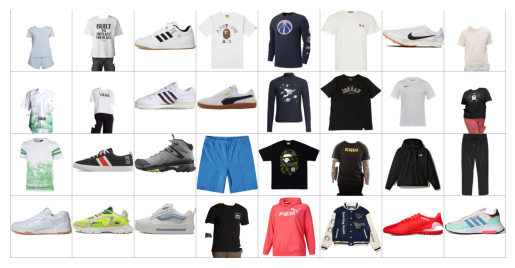

In [ ]:
from torchvision.utils import make_grid

processed_images_dir = 'C:/Users/klimk/Desktop/Project/dataframes/df1_photos/df1_photos'

processed_images_files = [os.path.join(processed_images_dir, f) for f in os.listdir(processed_images_dir) if f.endswith('.jpg')]

random_images_files = random.sample(processed_images_files, 32)

transform = transforms.ToTensor()
selected_images = [transform(Image.open(image_file).convert("RGB")) for image_file in random_images_files]

batch = torch.stack(selected_images)

grid = make_grid(batch).permute(1, 2, 0)

plt.imshow(grid)
plt.axis('off')
plt.show()

In [ ]:
df = pd.read_csv('C:/Users/klimk/Desktop/Project/dataframes/df1_photos/df1.csv')
type_counts = df['Type'].value_counts()
type_counts

Type
Sneakers             26207
T-shirt              13880
Pants                 7259
Shorts                5969
Hoodie                5146
Jacket                4295
Gumshoes              3312
Sweater               3102
Sweatshirt            2823
Longsleeve            2261
Slippers              1961
Boots                 1835
Tank-top              1720
Leggings              1392
Top                   1304
Football boots        1277
Polo                  1269
Full-zip Hoodie       1185
Shirt                 1141
Football sneakers      667
Puffer jacket          621
Sandals                580
Shoes                  497
Vest                   481
Dress                  430
Skirt                  278
Parka                  248
Name: count, dtype: int64

In [ ]:
data_dir = 'C:/Users/klimk/Desktop/Project/dataframes/df1_photos/df1_photos'

def load_image(file_name):
    file_path = os.path.join(data_dir, file_name + '.jpg')
    if os.path.exists(file_path):
        image = Image.open(file_path)
        return image
    else:
        return None

In [ ]:
def filter_df_by_images(df):
    valid_skus = []
    for sku in df['sku']:
        if load_image(sku) is not None:
            valid_skus.append(sku)
    return df[df['sku'].isin(valid_skus)].reset_index(drop=True)

df = filter_df_by_images(df)

print(f"New dataframe size: {len(df)}")

New dataframe size: 90637


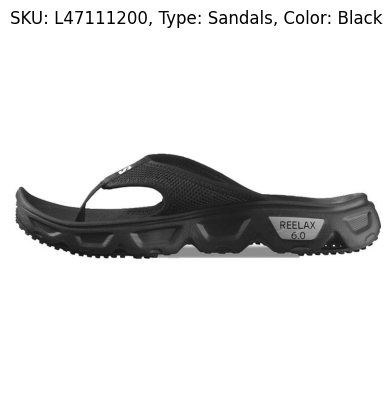

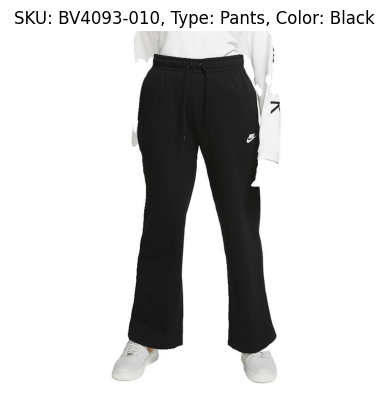

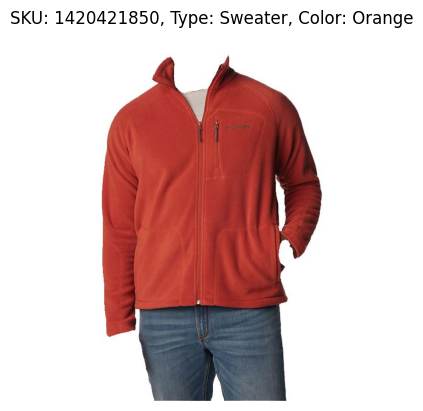

In [ ]:
processed_images_files = [f for f in os.listdir(processed_images_dir) if f.endswith('.jpg')]

random_skus = random.sample(processed_images_files, 3)

for sku in random_skus:
    img_path = os.path.join(processed_images_dir, sku)
    img = Image.open(img_path).convert("RGB")

    sku_name = os.path.splitext(sku)[0]

    sku_row = df[df['sku'] == sku_name]
    if not sku_row.empty:
        label_name = sku_row['Type'].values[0]
        color_name = sku_row['Color'].values[0]

        plt.imshow(img)
        plt.title(f"SKU: {sku_name}, Type: {label_name}, Color: {color_name}")
        plt.axis('off')
        plt.show()
    else:
        print(f"SKU {sku_name} not found in dataframe.")

In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

df['Type'] = label_encoder.fit_transform(df['Type'])

type_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))

type_mapping

{'Boots': 0,
 'Dress': 1,
 'Football boots': 2,
 'Football sneakers': 3,
 'Full-zip Hoodie': 4,
 'Gumshoes': 5,
 'Hoodie': 6,
 'Jacket': 7,
 'Leggings': 8,
 'Longsleeve': 9,
 'Pants': 10,
 'Parka': 11,
 'Polo': 12,
 'Puffer jacket': 13,
 'Sandals': 14,
 'Shirt': 15,
 'Shoes': 16,
 'Shorts': 17,
 'Skirt': 18,
 'Slippers': 19,
 'Sneakers': 20,
 'Sweater': 21,
 'Sweatshirt': 22,
 'T-shirt': 23,
 'Tank-top': 24,
 'Top': 25,
 'Vest': 26}

In [ ]:
len(type_mapping)

27

In [ ]:
from sklearn.model_selection import train_test_split

train_ratio = 0.8

grouped = df.groupby('Type')

train_list = []
val_list = []

for _, group in grouped:
    train, val = train_test_split(group, test_size=1 - train_ratio, random_state=42)
    train_list.append(train)
    val_list.append(val)

train_data = pd.concat(train_list).reset_index(drop=True)
val_data = pd.concat(val_list).reset_index(drop=True)

print(f"Train data size: {len(train_data)}")
print(f"Validation data size: {len(val_data)}")

Train data size: 72498
Validation data size: 18139


In [ ]:
from torch.utils.data import Dataset
from PIL import Image
from tqdm import tqdm
import os

train_transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.Normalize(mean=[0.8329, 0.8211, 0.8254], std=[0.2497, 0.2639, 0.2580])
])

test_transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.8329, 0.8211, 0.8254], std=[0.2497, 0.2639, 0.2580])
])


class TransformDataset(Dataset):
    def __init__(self, dataframe, data_dir, transform=None):
        self.dataframe = dataframe.reset_index(drop=True)
        self.data_dir = data_dir
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        if idx >= len(self.dataframe):
            raise IndexError(f"Index {idx} extends beyond the DataFrame")

        try:
            row = self.dataframe.iloc[idx:idx+1].squeeze()
        except KeyError as e:
            raise KeyError(f"Index access error {idx} in DataFrame: {e}")

        sku = row['sku']
        img_path = os.path.join(self.data_dir, f"{sku}.jpg")
        image = Image.open(img_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        label = row['Type']
        label = torch.tensor(label, dtype=torch.long)
        return image, label


train_dataset = TransformDataset(train_data, data_dir=data_dir, transform=train_transform)
val_dataset = TransformDataset(val_data, data_dir=data_dir, transform=test_transform)

print(f"Train Dataset size: {len(train_dataset)}")
print(f"Validation Dataset size: {len(val_dataset)}")

Train Dataset size: 72498
Validation Dataset size: 18139


In [ ]:
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=batch_size, generator=generator)
val_loader = DataLoader(val_dataset, shuffle=False, batch_size=batch_size, generator=generator)

In [ ]:
# means = []
# stds = []

# print("Calculation of mean values ​​and standard deviations for normalization:")
# for idx, (img, _) in enumerate(tqdm(val_dataset, desc="Calculating mean/std")):
#     if img.shape[0] == 3:
#         means.append(torch.mean(img, dim=[1, 2]).tolist())
#         stds.append(torch.std(img, dim=[1, 2]).tolist())
#     else:
#         filename = val_data.iloc[idx]['sku']
#         print(f"The image {filename} has an incorrect number of channels: {img.shape[0]}")

# mean = torch.mean(torch.tensor(means), dim=0)
# std = torch.mean(torch.tensor(stds), dim=0)

# mean, std

In [ ]:
from torchvision import models

# resnet152 = models.resnet152(pretrained=True)
# resnet152

In [ ]:
vgg = models.vgg19(pretrained=True)
vgg

C:\Users\klimk\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\klimk\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [ ]:
class TransferLearningClassifier(nn.Module):
    def __init__(self, num_classes=27):
        super().__init__()

        vgg = models.vgg19(pretrained=True)

        for param in vgg.parameters():
            param.requires_grad = False

        in_features = vgg.classifier[0].in_features

        vgg.classifier = nn.Identity()

        self.feature_extractor = nn.Sequential(
            vgg.features,
            vgg.avgpool
        )

        self.flatten = nn.Flatten()

        self.fc1 = nn.Linear(in_features, 512)
        self.dropout1 = nn.Dropout(0.5)
        self.fc2 = nn.Linear(512, 256)
        self.dropout2 = nn.Dropout(0.5)
        self.fc3 = nn.Linear(256, num_classes)

    def forward(self, x):
        out = self.feature_extractor(x)
        out = self.flatten(out)
        out = F.relu(self.fc1(out))
        out = self.dropout1(out)
        out = F.relu(self.fc2(out))
        out = self.dropout2(out)
        out = self.fc3(out)
        return out

    def predict(self, data_loader, device='cpu'):
        self.eval()
        all_preds = []

        with torch.no_grad():
            for inputs in data_loader:
                inputs = inputs.to(device)
                outputs = self(inputs)
                preds = F.softmax(outputs, dim=-1)
                all_preds.append(preds.cpu().numpy())

        return np.concatenate(all_preds, axis=0)

model = TransferLearningClassifier(num_classes=len(train_data['Type'].unique())).to(device)

In [ ]:
from torchsummary import summary

summary(model, input_size=(3, img_size, img_size))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

In [ ]:
class_counts = df['Type'].value_counts()

total_samples = len(df)

class_weights = {cls: total_samples / count for cls, count in class_counts.items()}

weights = torch.tensor([class_weights[cls] for cls in sorted(class_counts.index)], dtype=torch.float32).to(device)

weights

tensor([ 49.4743, 210.7837,  71.0321, 136.0916,  76.7460,  27.4574,  17.6440,
         21.2713,  65.4419,  40.2116,  12.5466, 365.4718,  72.3360, 146.1887,
        156.5406,  79.5061, 182.3682,  15.2793, 326.0324,  46.3143,   3.4775,
         29.8541,  32.2781,   6.5717,  53.0351,  69.7744, 189.6172],
       device='cuda:0')

In [ ]:
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.optim.lr_scheduler import StepLR

loss_fn = nn.CrossEntropyLoss(weight=weights)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

scheduler = StepLR(optimizer, step_size=5, gamma=0.75)

In [ ]:
import time

def train(model, optimizer, loss_fn, train_dl, val_dl, scheduler=None,
          metrics=None, metrics_name=None, epochs=20, patience=5, device=device,
          task='regression', log_interval=1):

    metrics = metrics if metrics else []
    metrics_name = metrics_name if metrics_name else [metric.__name__ for metric in metrics]

    history = {'loss': [], 'val_loss': [], 'val_accuracy_score': []}
    for name in metrics_name:
        history[name] = []
        history[f'val_{name}'] = []

    model.to(device)

    best_val_accuracy = -float('inf')
    patience_counter = 0
    early_stopping = False

    start_time_train = time.time()

    for epoch in range(epochs):
        if early_stopping:
            print("Early stopping triggered.")
            break

        start_time_epoch = time.time()

        model.train()
        history_train = {name: 0 for name in ['loss'] + metrics_name}

        for batch in train_dl:
            x = batch[0].to(device)
            y = batch[1].to(device)

            optimizer.zero_grad()
            y_pred = model(x)
            loss = loss_fn(y_pred, y)
            loss.backward()
            optimizer.step()

            y_pred = y_pred.detach().cpu().numpy()
            y = y.detach().cpu().numpy()

            history_train['loss'] += loss.item() * x.size(0)
            for name, func in zip(metrics_name, metrics):
                try:
                    if func == roc_auc_score:
                        if len(np.unique(y)) == 2:
                            history_train[name] += func(y, y_pred) * x.size(0)
                    else:
                        history_train[name] += func(y, y_pred) * x.size(0)
                except:
                    if task == 'binary':
                        y_pred_ = y_pred.round()
                    elif task == 'multiclass':
                        y_pred_ = y_pred.argmax(axis=-1)
                    history_train[name] += func(y, y_pred_) * x.size(0)

        for name in history_train:
            history_train[name] /= len(train_dl.dataset)

        model.eval()
        history_val = {f'val_{name}': 0 for name in ['loss'] + metrics_name}

        with torch.no_grad():
            for batch in val_dl:
                x = batch[0].to(device)
                y = batch[1].to(device)

                y_pred = model(x)
                loss = loss_fn(y_pred, y)

                y_pred = y_pred.cpu().numpy()
                y = y.cpu().numpy()

                history_val['val_loss'] += loss.item() * x.size(0)
                for name, func in zip(metrics_name, metrics):
                    try:
                        if func == roc_auc_score:
                            if len(np.unique(y)) == 2:
                                history_val[f'val_{name}'] += func(y, y_pred) * x.size(0)
                        else:
                            history_val[f'val_{name}'] += func(y, y_pred) * x.size(0)
                    except:
                        if task == 'binary':
                            y_pred_ = y_pred.round()
                        elif task == 'multiclass':
                            y_pred_ = y_pred.argmax(axis=-1)
                        history_val[f'val_{name}'] += func(y, y_pred_) * x.size(0)

        for name in history_val:
            history_val[name] /= len(val_dl.dataset)

        end_time_epoch = time.time()

        for name in history_train:
            history[name].append(history_train[name])
            history['val_' + name].append(history_val['val_' + name])

        total_time_epoch = end_time_epoch - start_time_epoch

        if epoch + 1 == 1 or (epoch + 1) % log_interval == 0 or epoch + 1 == epochs:
            print(f'Epoch {epoch + 1:4d} {total_time_epoch:4.0f}sec', end='\t')
            for name in history_train:
                print(f'{name}: {history[name][-1]:10.3g}', end='\t')
                print(f"val_{name}: {history['val_' + name][-1]:10.3g}", end='\t')
            print()

        if scheduler:
            scheduler.step()

        current_val_accuracy = history_val.get('val_accuracy_score', None)

        if current_val_accuracy is not None and current_val_accuracy > best_val_accuracy:
            best_val_accuracy = current_val_accuracy
            patience_counter = 0
        else:
            patience_counter += 1
            print(f"Patience counter: {patience_counter}/{patience}")
            if patience_counter >= patience:
                early_stopping = True

    end_time_train = time.time()
    total_time_train = end_time_train - start_time_train
    print()
    print('Time total:     %5.2f sec' % (total_time_train))

    return history

In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score

history = train(model, optimizer, loss_fn, train_loader, val_loader,
                epochs=20,
                metrics=[accuracy_score],
                scheduler=scheduler,
                patience=4,
                device=device,
                task='multiclass',
               log_interval=1)

Epoch    1 5998sec	loss:       1.14	val_loss:      0.815	accuracy_score:      0.601	val_accuracy_score:      0.729	
Epoch    2 5976sec	loss:       0.86	val_loss:      0.789	accuracy_score:      0.686	val_accuracy_score:      0.711	
Patience counter: 1/4
Epoch    3 5941sec	loss:      0.752	val_loss:      0.716	accuracy_score:      0.725	val_accuracy_score:      0.755	
Epoch    4 5911sec	loss:      0.668	val_loss:      0.659	accuracy_score:      0.742	val_accuracy_score:      0.767	
Epoch    5 5897sec	loss:      0.634	val_loss:      0.648	accuracy_score:       0.76	val_accuracy_score:      0.782	
Epoch    6 6038sec	loss:      0.544	val_loss:      0.577	accuracy_score:      0.787	val_accuracy_score:      0.812	
Epoch    7 5911sec	loss:      0.506	val_loss:      0.527	accuracy_score:      0.801	val_accuracy_score:      0.835	
Epoch    8 6109sec	loss:       0.49	val_loss:      0.554	accuracy_score:      0.807	val_accuracy_score:      0.821	
Patience counter: 1/4
Epoch    9 6203sec	loss:    

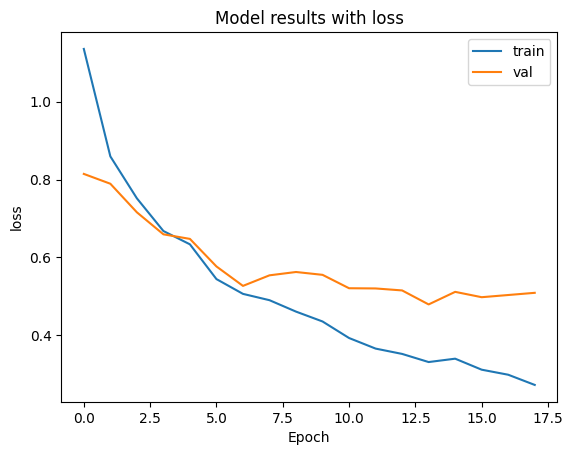

In [ ]:
import matplotlib.pyplot as plt

def plot_metric(history, name):
    plt.title(f"Model results with {name}")
    plt.plot(history[name], label='train')
    plt.plot(history['val_'+name], label='val')
    plt.xlabel('Epoch')
    plt.ylabel(name)
    plt.legend()


plot_metric(history, 'loss')

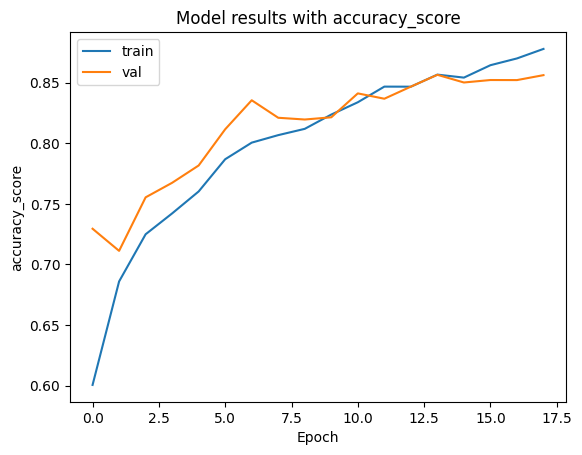

In [ ]:
plot_metric(history, 'accuracy_score')

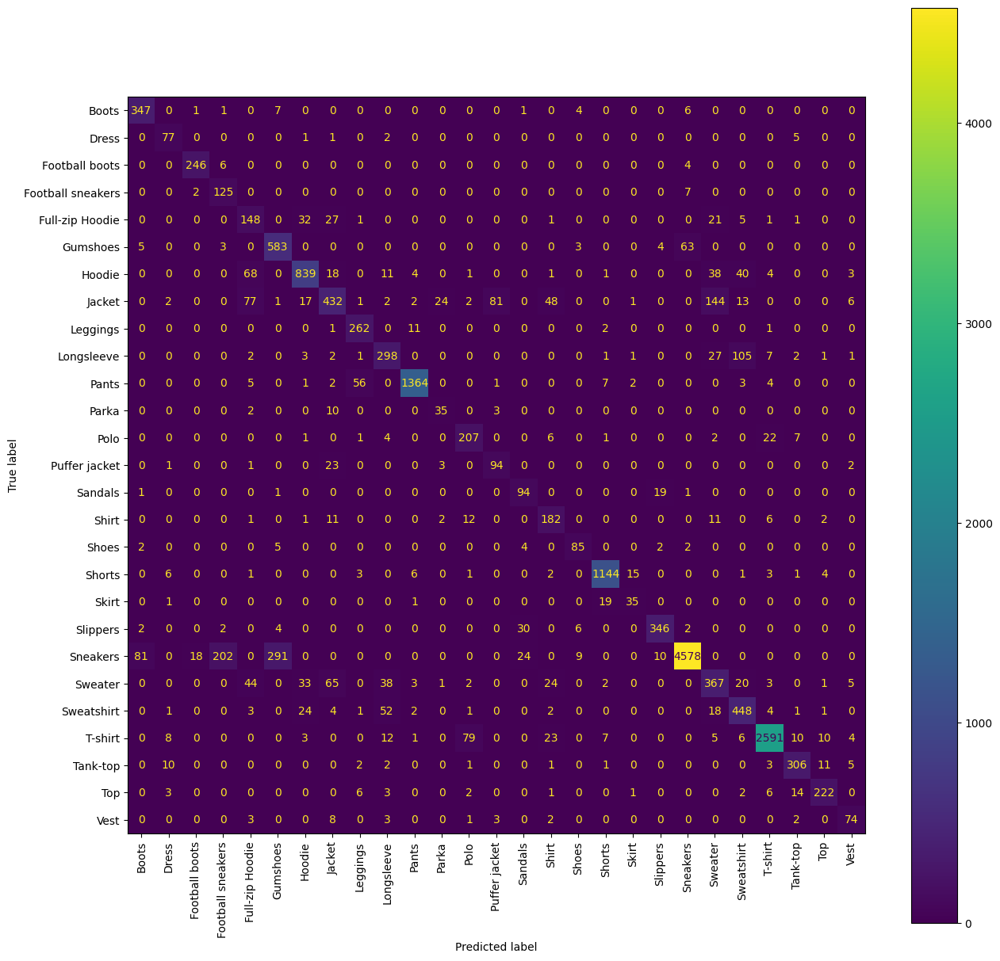

In [ ]:
inverse_type_mapping = {v: k for k, v in type_mapping.items()}

model = model.to('cpu')
model.eval()

y_pred = []
y_true = []

with torch.no_grad():
    for X, y in val_loader:
        y_true.extend(y.cpu().numpy())
        X = X.to('cpu')
        y_pred_ = model(X)
        y_pred_ = y_pred_.argmax(-1).cpu().numpy()
        y_pred.extend(y_pred_)

y_true_text = [inverse_type_mapping[label] for label in y_true]
y_pred_text = [inverse_type_mapping[label] for label in y_pred]

class_labels = [inverse_type_mapping[i] for i in sorted(inverse_type_mapping.keys())]

fig, ax = plt.subplots(figsize=(15, 15))
ConfusionMatrixDisplay.from_predictions(y_true_text, y_pred_text, display_labels=class_labels, ax=ax)
plt.xticks(rotation=90)
plt.show()

In [ ]:
model_save_path = 'C:/Users/klimk/Desktop/Nike/model_90k_v0.1.pth'
torch.save(model.state_dict(), model_save_path)
print(f"Model saved to {model_save_path}")